### ライブラリの準備

###モジュールのインポートとGoogleドライブのマウント

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import datetime
#from tqdm import tqdm
from tqdm.notebook import tqdm
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import SubsetRandomSampler
from PIL import Image
from collections import deque
from typing import Sequence, Dict, Tuple, Union

import torch
from torch import nn
from torch.amp import autocast, GradScaler
import torch.nn.functional as F
import torchvision.datasets as dataset
from torchvision.transforms import v2

from transformers import  CLIPVisionModel, get_linear_schedule_with_warmup, AutoModelForCausalLM, AutoTokenizer

import util
import levenshtein
from nltk import bleu_score
from cidereval import cider, ciderD
from cidereval.tokenizer import SimpleTokenizer

import tiktoken
from previous_chapters import CAPT_AR_PAD_GPTModel, load_weights_into_gpt
from gpt_download import download_and_load_gpt2

2025-08-16 01:59:32.698085: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-16 01:59:32.789792: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1755277172.827836  196744 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1755277172.839365  196744 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1755277172.916205  196744 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

### CaptioningTransformer

In [2]:
class CaptioningTransformer(nn.Module):
    '''
    CaptioningTransformerのコンストラクタ
    dim_embedding  : 埋め込み次元
    dim_feedforward: FNNの中間特徴次元
    num_heads      : マルチヘッドアテンションのヘッド数
    num_layers     : Transformerデコーダ層の数
    vocab_size     : 辞書の次元
    null_index     : NULLのID
    dropout        : ドロップアウト確率
    '''
    def __init__(self, clip_dim: int, dim_embedding: int, vocab_size: int, tokenizer, dropout: float = 0.1, endoftext_token_id: int=50256):
        super().__init__()

        #CLIP
        path = "../clip-vit-large-patch14-336"
        self.clip_model = CLIPVisionModel.from_pretrained(pretrained_model_name_or_path = path, output_hidden_states = True)
        
        # Dense Connector
        #self.dc_ln = nn.LayerNorm( clip_dim * 3 )
        self.dc_linear = nn.Linear( clip_dim * 3, dim_embedding )
        self.dropout = nn.Dropout( dropout )        
        self.ln_memory = nn.LayerNorm( dim_embedding )

        # Down Sampling
        self.conv1 = nn.Conv1d( dim_embedding, dim_embedding, 1, 5 )
        self.conv2 = nn.Conv1d( dim_embedding, dim_embedding, 1, 2 )

        # Word Embeidding
        self.emb = nn.Embedding( vocab_size, dim_embedding )
        
        #GPT2 as decoder
        BASE_CONFIG = {
            "vocab_size": 50257,     # Vocabulary size
            "context_length": 1024,  # Context length
            "drop_rate": 0.0,        # Dropout rate
            "qkv_bias": True         # Query-key-value bias
        }
        model_configs = {
            "gpt2-small (124M)": {"emb_dim": 768, "n_layers": 12, "n_heads": 12},
            "gpt2-medium (355M)": {"emb_dim": 1024, "n_layers": 24, "n_heads": 16},
            "gpt2-large (774M)": {"emb_dim": 1280, "n_layers": 36, "n_heads": 20},
            "gpt2-xl (1558M)": {"emb_dim": 1600, "n_layers": 48, "n_heads": 25},
        }

        CHOOSE_MODEL = "gpt2-large (774M)"

        BASE_CONFIG.update(model_configs[CHOOSE_MODEL])

        model_size = CHOOSE_MODEL.split(" ")[-1].lstrip("(").rstrip(")")
        settings, params = download_and_load_gpt2(
            model_size=model_size,
            models_dir="gpt2"
        )

        self.decoder = CAPT_AR_PAD_GPTModel(BASE_CONFIG)
        load_weights_into_gpt(self.decoder, params)
        
        # Others
        self.dim_embedding = dim_embedding
        self.tokenizer = tokenizer
        self.endoftext_token_id = endoftext_token_id

    ''' CaptioningTransformerの順伝播処理
    features: 画像特徴量 [バッチサイズ, 埋め込み次元]
    captions: 正解キャプション [バッチサイズ, 系列長]
    '''
    def forward(self, images: torch.Tensor, captions: torch.Tensor ):

        self.device = images.device

        memory = self.clip_model( images )
        memory = self.dense_connector( memory )
        memory = self.dropout( memory )
        memory = self.ln_memory( memory )

        memory = self.conv1( memory.transpose(1,2) )
        memory = self.conv2( memory ).transpose( 1, 2 )

        def my_index( list0, int0):
            if int0 in list0:
                return list0.index( int0 )
            else:
                return -1
        
        pad_pos = torch.tensor( [], device = self.device, dtype=torch.int )
        for caption in captions:
            pad_pos0 = my_index( caption.tolist(), self.endoftext_token_id ) 
            if pad_pos0 == -1:
                pad_pos = torch.cat( [pad_pos, torch.tensor([len( caption ) + 1]  , device = self.device)], dim = 0 )
            else:
                pad_pos = torch.cat( [pad_pos, torch.tensor([pad_pos0 + 1], device = self.device)], dim = 0 )
            
        emb_caption = self.emb( captions )

        gpt_in = torch.cat( [memory, emb_caption], dim = 1 )
        gpt_in_padding_masks = torch.ones( gpt_in.shape[:2], device = self.device ).bool()
        for n in range( len( gpt_in_padding_masks ) ):
            gpt_in_padding_masks[n,:memory.size(1) + pad_pos[n]] = False
        
        outputs = self.decoder( gpt_in, gpt_in_padding_masks )
        #outputs = self.decoder( inputs_embeds = gpt_in, attention_mask = gpt_in_padding_masks ).logits
        #outputs = self.decoder( inputs_embeds = gpt_in, attention_mask = gpt_in_padding_masks ).last_hidden_state
        #print( "ouputs:", outputs )
        outputs = outputs[:,memory.size(1) - 1:]
        
        return outputs

    def dense_connector(self, memory ):
        tmp1 = torch.tensor([], device = self.device )
        tmp2 = torch.tensor([], device = self.device )
        tmp_full = len( memory.hidden_states )
        tmp_half = tmp_full // 2
        for i in range( 0, tmp_half ):
            tmp1 = torch.cat( [tmp1, memory.hidden_states[i][None]], dim = 0 )
        tmp1 = torch.sum(tmp1, dim=0) / tmp_half
        for i in range( tmp_half, tmp_full ):
            tmp2 = torch.cat( [tmp2, memory.hidden_states[i][None]], dim = 0 )
        tmp2 = torch.sum(tmp2, dim=0 ) / ( tmp_full - tmp_half )
        tmp3 = torch.cat([tmp1, tmp2], dim=-1)
        tmp3 = torch.cat( [ memory.last_hidden_state, tmp3], dim = -1 )
        #tmp3 = sel.dc_ln( tmp3 )
        tmp3 = self.dc_linear( tmp3 )
        return tmp3

In [3]:
class MyDataset(Dataset):
    def __init__(self, file_path: str, img_directory: str, transforms, tokenizer) -> None:
        super().__init__()
        self.img_directory = img_directory
        self.transforms = transforms
        # TODO: fix to original data
        #画像の前処理
        self.img_file = []
        self.tokenss = []
        with open( file_path, "r" ) as f:
            #line = f.readline()
            #i = 0
            #while line:
            for i, line in enumerate( f ):
                if i % 100000 == 0:
                #    #print( line.split("\t")[0])
                #    #print( line.split("\t")[1])
                    print( "i:", i )
                #i += 1
                self.img_file.append(line.split("\t" )[0])
                caption = line.split("\t")[1].replace( "\r\n", "" ).replace( "\n", "").replace( "\r", "" ) + " <|endoftext|>"
                #print( "caption:", caption )
                id_tokens = tokenizer.encode( caption, allowed_special={"<|endoftext|>"})
                id_tokens = torch.tensor( id_tokens, requires_grad = False  )
                #print( "id_tokens:", id_tokens )
                self.tokenss.append( id_tokens )

                #line = f.readline()

    # ここで取り出すデータを指定している
    def __getitem__(
        self,
        index: int
    ):
        tokens = self.tokenss[index]
        img_file = self.img_file[index] + ".jpg"
        img_path = os.path.join( self.img_directory, img_file ) #index番目の画像のパスを取得
        img = Image.open(img_path) #PIL形式で画像を読み込み
        if img.mode != 'RGB':
            img = img.convert("RGB")
        img = self.transforms(img)
        
        return img, tokens

    # この method がないと DataLoader を呼び出す際にエラーを吐かれる
    def __len__(self) -> int:
        return len(self.tokenss)

In [4]:
def collate_func(batch: Sequence[Tuple[Union[torch.Tensor, str]]], pad_index ):
    imgs, tokens = zip(*batch)

    max_length = 0
    for target in tokens:
        if max_length < len( target ):
            max_length = len( target )
    
    targets = []
    lengths = []
    for target in tokens:
        pad_len = max_length - len( target ) 
        #print( "target:", target )
        input2= F.pad( target, (0, pad_len), mode='constant', value = pad_index)
        targets.append( input2 )
        lengths.append( len( target ) )
    
    imgs = torch.stack( imgs, dim = 0 )
    targets = torch.stack( targets, dim = 0 )
    lengths = torch.tensor( lengths )
    
    return imgs, targets, lengths

###学習におけるハイパーパラメータやオプションの設定

In [5]:
device = torch.device("cpu")
#device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
tokenizer = tiktoken.get_encoding("gpt2")
vocab_size = 50257
endoftext_token_id = 50256
model = CaptioningTransformer(clip_dim = 1024, dim_embedding=1280, vocab_size=vocab_size,tokenizer=tokenizer, \
                             dropout = 0.1, endoftext_token_id = endoftext_token_id ).to(device)
PATH = f'model/model_ar_gpt2_v7_curr.pth'
checkpoint = torch.load(PATH, map_location=torch.device('cpu'))
model.load_state_dict(checkpoint['model_state_dict'])
model = model.to( device )

File already exists and is up-to-date: gpt2/774M/checkpoint
File already exists and is up-to-date: gpt2/774M/encoder.json
File already exists and is up-to-date: gpt2/774M/hparams.json
File already exists and is up-to-date: gpt2/774M/model.ckpt.data-00000-of-00001
File already exists and is up-to-date: gpt2/774M/model.ckpt.index
File already exists and is up-to-date: gpt2/774M/model.ckpt.meta
File already exists and is up-to-date: gpt2/774M/vocab.bpe


In [6]:
# 画像のtransformsを定義
#transforms = v2.Compose([
#    v2.Resize((336, 336)),
#    #v2.ToTensor(),
#    v2.ToImage(),
#    v2.ToDtype(torch.float32, scale=True),
#    v2.AutoAugment(),
#    ## Coco データセット 2017 train の平均と標準偏差
#    #v2.Normalize((0.456,0.427,0.401),(0.224,0.219,0.231) )
#    # Clip Model の config から引用。
#    v2.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
#])

# 画像のtransformsを定義
transforms = v2.Compose([
    v2.Resize((336, 336)),
    #v2.ToTensor(),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    #v2.AutoAugment(),
    ## Coco データセット 2017 train の平均と標準偏差
    #v2.Normalize((0.456,0.427,0.401),(0.224,0.219,0.231) )
    # Clip Model の config から引用。
    v2.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
])

img_directory = '/mnt/ssd2/v7/img'
anno_file = '../CLIP_LLM_AR/dataset.txt'

# v7 データセット
train_dataset = MyDataset( file_path=anno_file,
                           img_directory = img_directory,
                           transforms=transforms,tokenizer=tokenizer)

# Subset samplerの生成
test_set, val_set, train_set = util.generate_subset_test_val_train(
    train_dataset, 0.1, 0.1 )
    
# 学習時にランダムにサンプルするためのサンプラー
train_sampler = SubsetRandomSampler(train_set)

# DataLoaderを生成
collate_func_lambda = lambda x: collate_func(x, endoftext_token_id)
test_loader = torch.utils.data.DataLoader(
                    train_dataset,
                    #batch_size=config.batch_size,
                    batch_size=1,
                    num_workers=0,
                    sampler=test_set,
                    collate_fn=collate_func_lambda)


i: 0
i: 100000
i: 200000
i: 300000
i: 400000
i: 500000


In [7]:
images = torch.randn( ( 1, 3, 336,336 ), device = device )
captions = torch.randint( 0, vocab_size, size=( 1, 50  ), device = device )
outputs = model( images, captions[:,:-1] )

### 推論関数の定義

In [8]:
def inference( imgs, length_max, temperature=0.0, top_k=None ):
    # batch_size = 1 で実行してください。
        
    device = imgs.device

    with torch.no_grad():
        memory = model.clip_model( imgs )
        memory = model.dense_connector( memory )
        memory = model.dropout( memory )
        memory = model.ln_memory( memory )

        memory = model.conv1( memory.transpose(1,2) )
        memory = model.conv2( memory ).transpose( 1, 2 )

        captions = torch.tensor( [[]], device = device, dtype = torch.long )
        
        for i in range( length_max ):
            if i == 0:
                gpt_in_padding_masks = torch.zeros( memory.shape[:2], device = device ).bool()
                #logits = model.decoder( inputs_embeds = memory, attention_mask = gpt_in_padding_masks ).logits
                logits = model.decoder( memory, gpt_in_padding_masks )
            else:
                emb_caption = model.emb( captions )
                gpt_in = torch.cat( [memory, emb_caption], dim = 1 )
                gpt_in_padding_masks = torch.zeros( gpt_in.shape[:2], device = device ).bool()
                #logits = model.decoder( inputs_embeds = gpt_in, attention_mask = gpt_in_padding_masks ).logits
                logits = model.decoder( gpt_in, gpt_in_padding_masks )
            logits = logits[:,-1]
            
            # New: Filter logits with top_k sampling
            if top_k is not None:
                # Keep only top_k values
                top_logits, _ = torch.topk(logits, top_k)
                min_val = top_logits[:, -1]
                logits = torch.where(logits < min_val, torch.tensor(float("-inf")).to(logits.device), logits)            

            # New: Apply temperature scaling
            if temperature > 0.0:
                logits = logits / temperature

                # Apply softmax to get probabilities
                probs = torch.softmax(logits, dim=-1)  # (batch_size, context_len)

                # Sample from the distribution
                idx_next = torch.multinomial(probs, num_samples=1)  # (batch_size, 1)

            # Otherwise same as before: get idx of the vocab entry with the highest logits value
            else:
                idx_next = torch.argmax(logits, dim=-1, keepdim=True)  # (batch_size, 1)

            captions = torch.cat( [captions, idx_next], dim = 1 )
            
            #word = torch.argmax( last_outputs, dim = 1 )
            #captions = torch.cat( [captions, word[None]], dim = 1 )
        
    return captions

In [9]:
def inference2( imgs, length_max, temperature=0.0, top_k=None ):
    # batch_size = 1 で実行してください。
        
    device = imgs.device

    with torch.no_grad():
        memory = model.clip_model( imgs )
        memory = model.dense_connector( memory )
        memory = model.dropout( memory )
        memory = model.ln_memory( memory )

        memory = model.conv1( memory.transpose(1,2) )
        memory = model.conv2( memory ).transpose( 1, 2 )

        captions = torch.tensor( [[]], device = device, dtype = torch.long )

        generated = memory
        
        for i in range( length_max ):
            gpt_in_padding_masks = torch.zeros( generated.shape[:2], device = device ).bool()
            outputs = model.decoder( generated, gpt_in_padding_masks )
            '''
            if i == 0:
                gpt_in_padding_masks = torch.zeros( memory.shape[:2], device = device ).bool()
                #logits = model.decoder( inputs_embeds = memory, attention_mask = gpt_in_padding_masks ).logits
                logits = model.decoder( memory, gpt_in_padding_masks )
            else:
                emb_caption = model.emb( captions )
                gpt_in = torch.cat( [memory, emb_caption], dim = 1 )
                gpt_in_padding_masks = torch.zeros( gpt_in.shape[:2], device = device ).bool()
                #logits = model.decoder( inputs_embeds = gpt_in, attention_mask = gpt_in_padding_masks ).logits
                logits = model.decoder( gpt_in, gpt_in_padding_masks )
            '''
            logits = outputs[:,-1]
            
            # New: Filter logits with top_k sampling
            if top_k is not None:
                # Keep only top_k values
                top_logits, _ = torch.topk(logits, top_k)
                min_val = top_logits[:, -1]
                logits = torch.where(logits < min_val, torch.tensor(float("-inf")).to(logits.device), logits)            

            # New: Apply temperature scaling
            if temperature > 0.0:
                logits = logits / temperature

                # Apply softmax to get probabilities
                probs = torch.softmax(logits, dim=-1)  # (batch_size, context_len)

                # Sample from the distribution
                idx_next = torch.multinomial(probs, num_samples=1)  # (batch_size, 1)

            # Otherwise same as before: get idx of the vocab entry with the highest logits value
            else:
                idx_next = torch.argmax(logits, dim=-1, keepdim=True)  # (batch_size, 1)

            next_token_embed = model.emb( idx_next )

            #print( "size of generated:", generated.size() )
            #print( "size of next_token_embed:", next_token_embed.size() )
            generated = torch.cat( (generated, next_token_embed), dim = 1 )
            
            captions = torch.cat( [captions, idx_next], dim = 1 )
            
            #word = torch.argmax( last_outputs, dim = 1 )
            #captions = torch.cat( [captions, word[None]], dim = 1 )
        
    return captions

  0%|          | 0/50744 [00:00<?, ?it/s]

PTBTokenizer tokenized 11 tokens at 156.46 tokens per second.
PTBTokenizer tokenized 11 tokens at 214.40 tokens per second.


avg_erro: 75.0
test number = 0, WER = 75.0, BLEU = 40.536529541015625
refe: In this I can see there are red colored strawberries. 
hypo: In this image we can see a food item.   . 


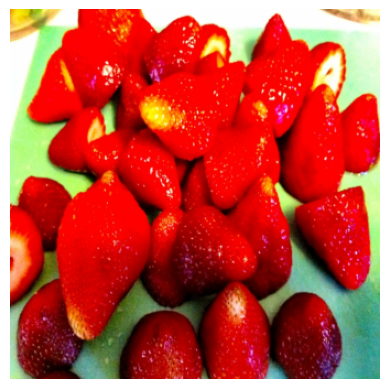

PTBTokenizer tokenized 22 tokens at 400.35 tokens per second.
PTBTokenizer tokenized 50 tokens at 972.22 tokens per second.


avg_erro: 182.6086956521739
test number = 1, WER = 128.80435180664062, BLEU = 37.80078125
refe: There are few persons sitting on the chairs. Here we can see monitors, keyboards, tables, and devices. 
hypo: In this picture we can see a group of people sitting on the chairs, some objects, some objects on the tables, some objects, some objects are placed on the surface, we can see some objects on the tables and in the background, we can


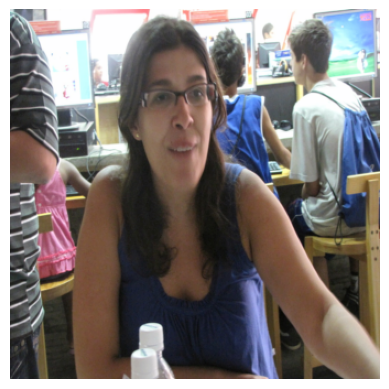

PTBTokenizer tokenized 54 tokens at 1029.79 tokens per second.
PTBTokenizer tokenized 45 tokens at 854.01 tokens per second.


avg_erro: 80.35714285714286
test number = 2, WER = 112.65528106689453, BLEU = 42.27894973754883
refe: This image is taken outdoors. At the bottom of the there is a floor. In the background there are a few buildings with walls, windows and balconies. In the middle of the image two men and a woman are standing on the floor and they are with smiling faces. 
hypo: This is an outside view. Here I can see a woman standing on the ground. Two persons are wearing black dress and standing on the floor. In the background, I can see a building, a building and the sky. 


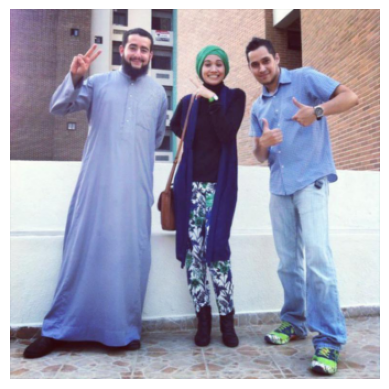

PTBTokenizer tokenized 19 tokens at 325.95 tokens per second.
PTBTokenizer tokenized 50 tokens at 852.82 tokens per second.


avg_erro: 215.0
test number = 3, WER = 138.241455078125, BLEU = 40.730072021484375
refe: In this image in front there are plants. In the background of the image there is sky. 
hypo: This picture is clicked outside. In the center we can see the plants and we can see the flowers. In the background there are plants and we can see the flowers. At the top we can see the sky and the clouds are present in the dark


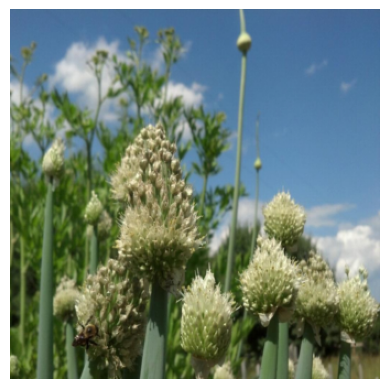

PTBTokenizer tokenized 18 tokens at 334.53 tokens per second.
PTBTokenizer tokenized 24 tokens at 505.66 tokens per second.


avg_erro: 120.0
test number = 4, WER = 134.59317016601562, BLEU = 42.902305603027344
refe: This is a black and white image. In this image we can see women wearing spectacles. 
hypo: In the picture we can see a woman wearing a cap and the black jacket is standing on the floor.  . This picture


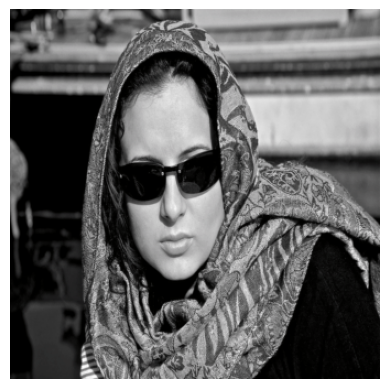

PTBTokenizer tokenized 21 tokens at 390.89 tokens per second.
PTBTokenizer tokenized 9 tokens at 175.67 tokens per second.


avg_erro: 81.81818181818183
test number = 5, WER = 125.79733276367188, BLEU = 39.72591018676758
refe: As we can see in the image there is a white color plate. In plate there is a dish. 
hypo: In this image we can see food item. . . 


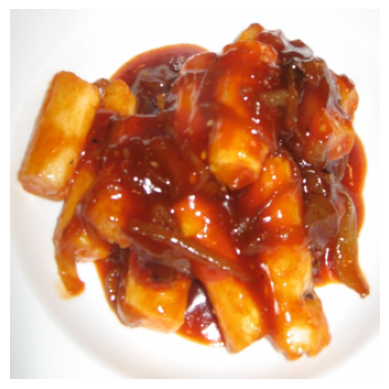

PTBTokenizer tokenized 68 tokens at 1190.31 tokens per second.
PTBTokenizer tokenized 50 tokens at 958.71 tokens per second.


avg_erro: 82.6086956521739
test number = 6, WER = 119.62752532958984, BLEU = 39.197628021240234
refe: This image is clicked in a musical concert where there is a woman Standing and she is holding a guitar in her hand. She is wearing black color dress. There is a mic in front of her and there is a bottle. She is holding a stick. There are speakers back side and there are some musical instruments on the bottom left corner. 
hypo: In this image we can see a person standing on the floor and holding a guitar. In front of her we can see a microphone and a wall. At the top we can see a light, wall and a light. In the background we can see


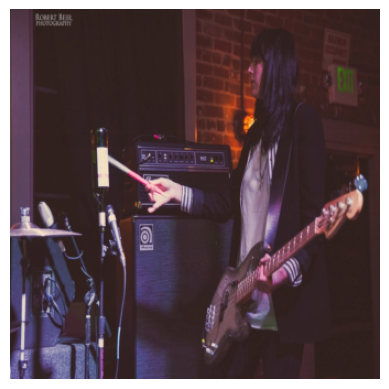

PTBTokenizer tokenized 18 tokens at 388.81 tokens per second.
PTBTokenizer tokenized 17 tokens at 324.95 tokens per second.


avg_erro: 47.368421052631575
test number = 7, WER = 110.59513854980469, BLEU = 42.76853561401367
refe: In this image, we can see a black color dog, there is a blurred background. 
hypo: In this image we can see a cat. In the background there is snow. . 


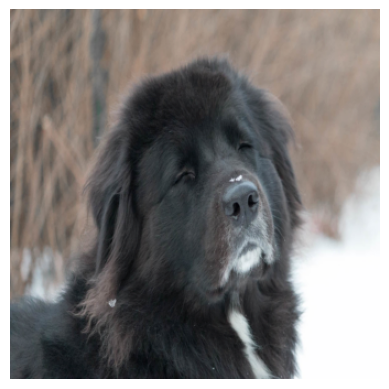

PTBTokenizer tokenized 24 tokens at 466.15 tokens per second.
PTBTokenizer tokenized 15 tokens at 287.69 tokens per second.


avg_erro: 80.0
test number = 8, WER = 107.1956787109375, BLEU = 43.168556213378906
refe: In this picture there is a bowl and a plate in the center of the image, which contains food items in it. 
hypo: In this image we can see the plate containing food item on the plate.  


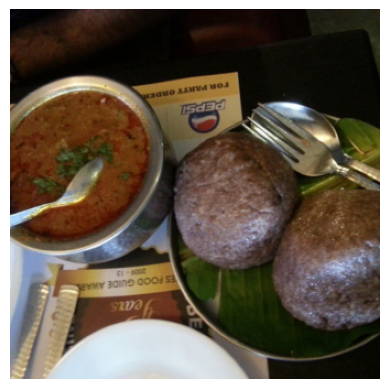

PTBTokenizer tokenized 39 tokens at 656.91 tokens per second.
PTBTokenizer tokenized 18 tokens at 308.16 tokens per second.


avg_erro: 67.5
test number = 9, WER = 103.22611236572266, BLEU = 41.714500427246094
refe: In this picture I can observe some food places in the plate. The food is in brown, orange, green and red colors. It is looking like a burger. The background is completely blurred. 
hypo: In this picture we can see food items in the plate and there is a blurry background.  


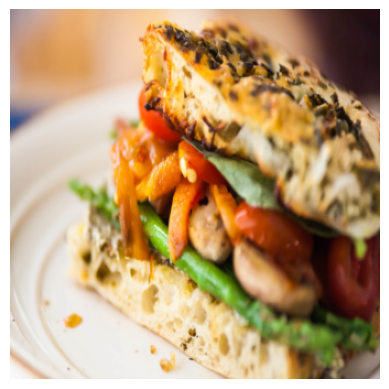

PTBTokenizer tokenized 46 tokens at 992.94 tokens per second.
PTBTokenizer tokenized 41 tokens at 794.88 tokens per second.


avg_erro: 72.3404255319149
test number = 10, WER = 100.4183120727539, BLEU = 43.40895462036133
refe: In this image i can see a person standing wearing a black shirt, blue jeans and glasses. He is holding a electronic gadget in his hand. In the background i can see few people standing, and the ceiling of the building. 
hypo: In this image I can see a man is standing, he wore a white shirt and blue color jacket, in front of him I can see few persons standing and I can see few objects in the background. 


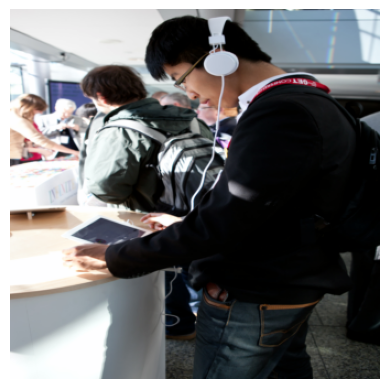

PTBTokenizer tokenized 32 tokens at 616.41 tokens per second.
PTBTokenizer tokenized 50 tokens at 920.25 tokens per second.


avg_erro: 123.52941176470588
test number = 11, WER = 102.34423828125, BLEU = 43.42014694213867
refe: In this image we can see cars, people, banners, hoardings, tent, pole, trees, boards, and buildings. In the background there is sky. 
hypo: In the center of the image we can see a person standing and holding some object and there is a person in a vehicle and a banner. On the right and left side of the image we can see vehicles on the road. In the background there are


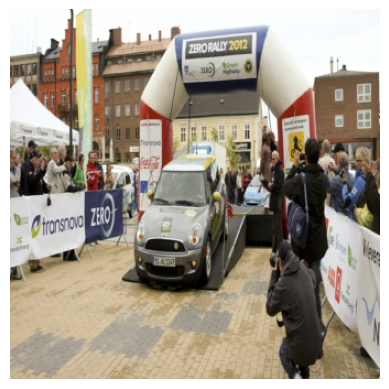

PTBTokenizer tokenized 32 tokens at 562.47 tokens per second.
PTBTokenizer tokenized 50 tokens at 948.69 tokens per second.


avg_erro: 115.15151515151516
test number = 12, WER = 103.32942199707031, BLEU = 43.7325439453125
refe: In this image we can see two persons standing and holding the objects, there are some stones, grass, plants and trees, also we can see the sky. 
hypo: In this image, we can see two persons wearing clothes and standing on the ground. There is a person in the middle of the image. There is a rock in the bottom of the image. There is a sky at the top of the image.


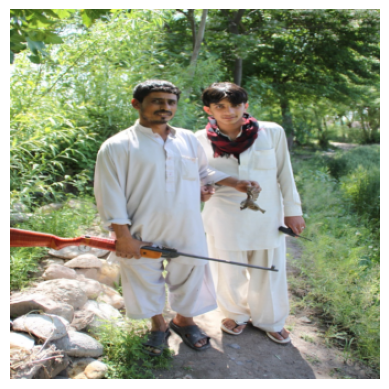

PTBTokenizer tokenized 39 tokens at 713.03 tokens per second.
PTBTokenizer tokenized 24 tokens at 455.24 tokens per second.


avg_erro: 79.54545454545455
test number = 13, WER = 101.63056945800781, BLEU = 42.64521026611328
refe: In front of the image there are some engravings on the headstone, around the headstone on the surface there are green leaves and dry leaves and sticks, behind the headstone there are trees and a wall. 
hypo: In this image we can see a stone with a stone and a stone. In the background there are plants and trees. 


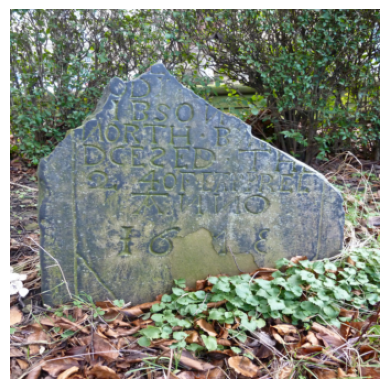

PTBTokenizer tokenized 15 tokens at 279.51 tokens per second.
PTBTokenizer tokenized 20 tokens at 368.12 tokens per second.


avg_erro: 106.25
test number = 14, WER = 101.93852996826172, BLEU = 42.036869049072266
refe: In this picture I can see building and few trees and a cloudy sky. 
hypo: In this image there is a wall, on the top of the roof there is a tree. .


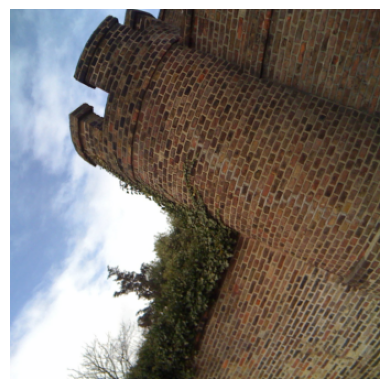

PTBTokenizer tokenized 34 tokens at 621.31 tokens per second.
PTBTokenizer tokenized 32 tokens at 620.28 tokens per second.


avg_erro: 82.85714285714286
test number = 15, WER = 100.74594116210938, BLEU = 42.49391555786133
refe: In this image there are many people in front of the building. Some of them are holding camera. In the background there are buildings. There is a banner over here. 
hypo: In this picture I can see few people are standing and holding cameras and I can see a camera in the backdrop. I can see the sky in the middle. 


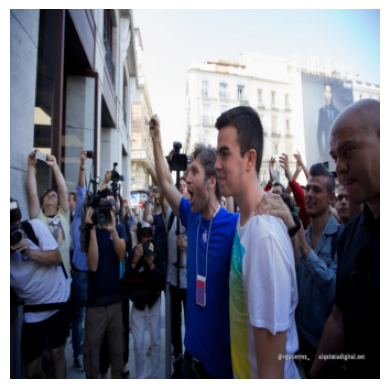

PTBTokenizer tokenized 30 tokens at 535.94 tokens per second.
PTBTokenizer tokenized 16 tokens at 251.24 tokens per second.


avg_erro: 67.74193548387096
test number = 16, WER = 98.80452728271484, BLEU = 42.09407424926758
refe: In this image I can see a snake on the ground. It is in black color. I can see few wooden sticks,few stones and grass. 
hypo: In this image we can see the rock. There are stones and grass. . 


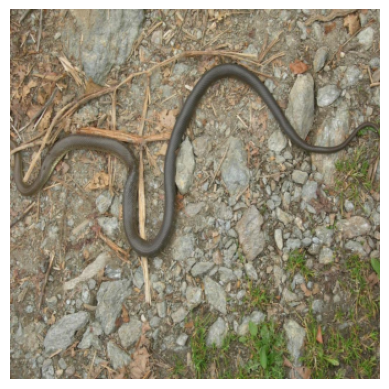

PTBTokenizer tokenized 48 tokens at 837.13 tokens per second.
PTBTokenizer tokenized 50 tokens at 1089.11 tokens per second.


avg_erro: 81.63265306122449
test number = 17, WER = 97.85053253173828, BLEU = 43.19483947753906
refe: In this image we can see a person standing and holding a book and to the side we can see a podium with mic and there is a laptop and some other objects on the table. We can see a person standing in the bottom right. 
hypo: In the picture we can see a woman sitting on the chair, she is speaking in front of her, she is wearing a black color dress and standing near the table on the table, on the table we can see a paper, beside to her we


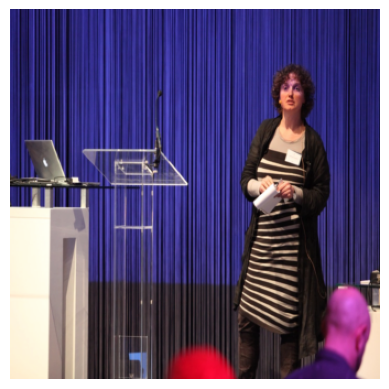

PTBTokenizer tokenized 58 tokens at 1010.44 tokens per second.
PTBTokenizer tokenized 30 tokens at 571.49 tokens per second.


avg_erro: 81.35593220338984
test number = 18, WER = 96.9823989868164, BLEU = 42.14509582519531
refe: In this picture I can see 2 women in front and the women right is holding a brush in her hand and I see the paint on the face of the woman on the left and in the background I see the grass and on the top left of this image I see the blue color things. 
hypo: In this image, we can see a woman and there are some people. At the bottom, there is a grass and we can see some objects. 


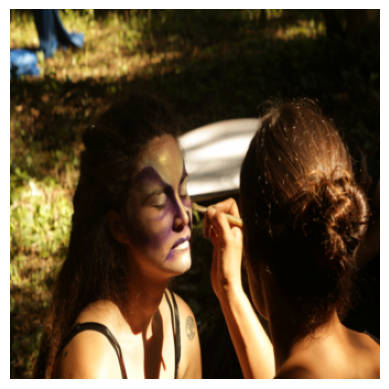

PTBTokenizer tokenized 31 tokens at 602.75 tokens per second.
PTBTokenizer tokenized 34 tokens at 732.50 tokens per second.


avg_erro: 84.84848484848484
test number = 19, WER = 96.3757095336914, BLEU = 42.47240447998047
refe: In this image we can see an animal, water, rocks, and leaves. At the bottom of the image we can see a person who is truncated. 
hypo: In this image there is one person standing and holding a snake in the water. There is a fish in the bottom left corner and the water might be in the water. 


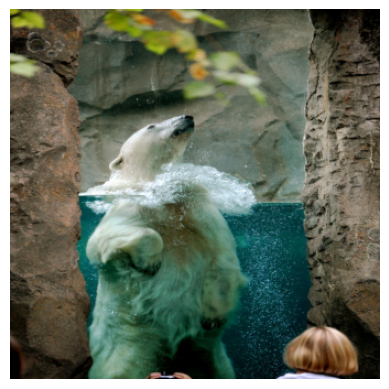

PTBTokenizer tokenized 42 tokens at 799.85 tokens per second.
PTBTokenizer tokenized 30 tokens at 571.14 tokens per second.


avg_erro: 69.76744186046511
test number = 20, WER = 95.108642578125, BLEU = 43.00392532348633
refe: In this image we can see three people, one of them is wearing a backpack, in front of them, we can see some bags, box, also we can see some plants, grass, and trees. 
hypo: In this image I can see two persons. In front the person is holding a cloth and in the background I can see grass, number of trees. 


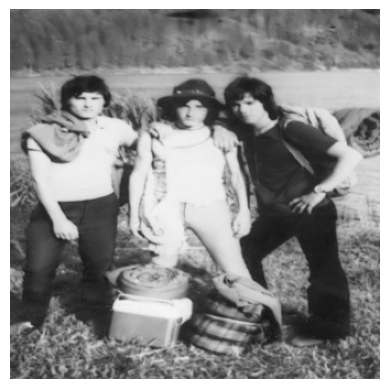

test WER: 95.10864449240346
test BLEU: 43.003924118227154
test CIDER: 1.683601909431615


In [10]:
#test_pr_coef = len( test_loader ) // 20
test_pr_coef = 1

fn = bleu_score.SmoothingFunction().method7

transforms_inv = v2.Compose([
    v2.Normalize((-0.48145466/0.26862954, -0.4578275/0.26130258, -0.40821073/0.27577711), (1/0.26862954,1/0.26130258,1/0.27577711)),
    v2.ToPILImage()
])

# 検証
with tqdm(test_loader) as pbar:
    pbar.set_description(f'[テスト]')

    # 評価モード
    model.eval()

    test_errors = deque()
    test_bleus = deque()
    test_ciders = deque()
    length_max = 50
    n_batch = 0
    for k, (imgs, captions, caption_lengths) in enumerate( pbar ):
        if k > 20:
            break
        # ミニバッチを設定
        #imgs = imgs.to(config.device)
        #captions = captions.to(config.device)
        imgs = imgs.to(device)
        captions = captions.to(device)
        #caption_lengths = torch.tensor( caption_lengths ).to(config.device)
        
        with torch.no_grad():
            outputs = inference2(imgs, length_max, temperature = 0.8, top_k = 5 )
            hypo_ids = outputs

        n = 0
        hypo_sentence = []
        ref_sentence = []
        ref_imgs = []
        total_error = 0
        total_token_length = 0
        total_bleu = 0
        total_cider = 0
        n2 = 0
        for (hypo_id, caption, img ) in zip( hypo_ids, captions, imgs ):
            hypo = tokenizer.decode( [token_id for token_id in hypo_id.tolist() if token_id != 50256 ] )
            reference = tokenizer.decode( [token_id for token_id in caption.tolist() if token_id != 50256 ] )
            hypo_tokens = [tokenizer.decode( [token_id] ) for token_id in hypo_id if token_id != 50256 ]
            ref_tokens = [tokenizer.decode( [token_id] ) for token_id in caption if token_id != 50256 ]
                        
            # 認識誤りを計算
            (error, substitute, delete, insert, ref_length) = levenshtein.calculate_error(hypo_tokens, ref_tokens)
            
            # 誤り文字数を累積する
            total_error += error
            # 文字の総数を累積する
            total_token_length += ref_length

            bleu = bleu_score.sentence_bleu( [reference], hypo, smoothing_function=fn  )

            cider_ = cider(predictions=[hypo], references=[[reference]])['avg_score']
            
            #print( "cider:", cider_ )
            
            total_bleu += bleu
            total_cider += cider_
            
            if n < 1 and n_batch % test_pr_coef == 0:
                hypo_sentence.append( hypo )
                ref_sentence.append( reference )
                ref_imgs.append( img )
                   
            n += 1
            n2 += 1
                
        n_batch += 1
        avg_error = total_error / total_token_length * 100
        print( "avg_erro:", avg_error )
        avg_bleu = total_bleu / n2 * 100
        avg_cider = total_cider / n2
                
        test_errors.append(avg_error)
        test_bleus.append(avg_bleu)
        test_ciders.append( avg_cider )
        
        #if len(test_errors) > config.moving_avg:
        if len(test_errors) > 100:
            test_errors.popleft()
            test_bleus.popleft()
            test_ciders.popleft()
        mean_error = torch.Tensor(test_errors).mean().item()
        mean_bleu = torch.Tensor(test_bleus).mean().item()
        mean_cider = torch.Tensor(test_ciders).mean().item()
        pbar.set_postfix({
            #'loss': torch.Tensor(test_losses).mean().item(),
            'WER': mean_error,
            'BLEU': mean_bleu,
            'CIDER': mean_cider
        })                
                
                    
        for ( hypo_se, ref_se, img ) in zip( hypo_sentence, ref_sentence, ref_imgs ):
            print(f'test number = {k}, WER = {mean_error}, BLEU = {mean_bleu}')
            print( "refe:", ref_se )
            print( "hypo:", hypo_se )
            inv_img = transforms_inv( img )
            plt.imshow( inv_img )
            plt.axis('off')
            plt.show()


# 表示
test_error = np.mean( test_errors )
test_bleu = np.mean( test_bleus )
test_cider = np.mean( test_ciders )
print(f'test WER: {test_error}')
print(f'test BLEU: {test_bleu}')
print(f'test CIDER: {test_cider}')

### テスト

  0%|          | 0/50744 [00:00<?, ?it/s]

PTBTokenizer tokenized 11 tokens at 209.17 tokens per second.
PTBTokenizer tokenized 21 tokens at 401.57 tokens per second.


avg_erro: 150.0
test number = 0, WER = 150.0, BLEU = 34.96045684814453
refe: In this I can see there are red colored strawberries. 
hypo: This picture consists of a plant. In the center there are some fruits and a white color food item. 


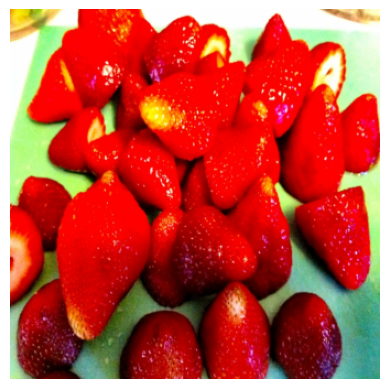

PTBTokenizer tokenized 22 tokens at 425.19 tokens per second.
PTBTokenizer tokenized 42 tokens at 803.90 tokens per second.


avg_erro: 156.52173913043478
test number = 1, WER = 153.2608642578125, BLEU = 40.64852523803711
refe: There are few persons sitting on the chairs. Here we can see monitors, keyboards, tables, and devices. 
hypo: In this image we can see a group of people sitting on chairs, in front of them there is a table, on that there is a laptop, we can also see a person's hand and a monitor. 


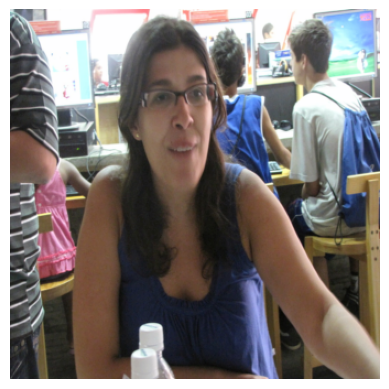

PTBTokenizer tokenized 54 tokens at 998.94 tokens per second.
PTBTokenizer tokenized 50 tokens at 906.56 tokens per second.


avg_erro: 94.64285714285714
test number = 2, WER = 133.72152709960938, BLEU = 46.34535598754883
refe: This image is taken outdoors. At the bottom of the there is a floor. In the background there are a few buildings with walls, windows and balconies. In the middle of the image two men and a woman are standing on the floor and they are with smiling faces. 
hypo: In the image we can see two men and a woman are standing, they are smiling, they are wearing clothes. Here there is the wall, there is a wall, there is a door, there are windows, there is a window, there are


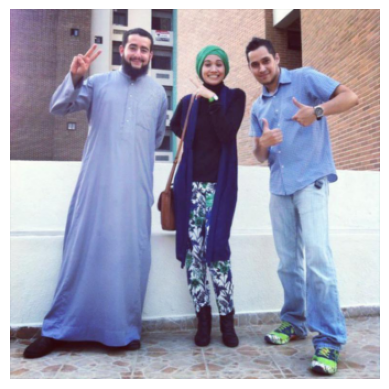

PTBTokenizer tokenized 19 tokens at 365.30 tokens per second.
PTBTokenizer tokenized 31 tokens at 600.42 tokens per second.


avg_erro: 114.99999999999999
test number = 3, WER = 129.0411376953125, BLEU = 47.01811981201172
refe: In this image in front there are plants. In the background of the image there is sky. 
hypo: This picture is clicked outside. In the center we can see the plants and flowers. In the background we can see the sky, trees and a sky. 


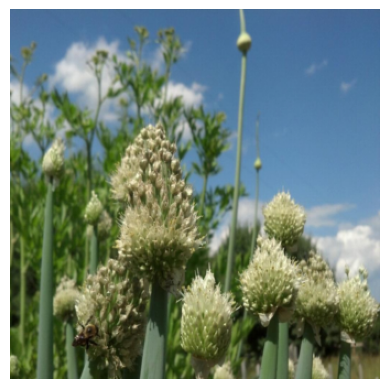

PTBTokenizer tokenized 18 tokens at 305.18 tokens per second.
PTBTokenizer tokenized 21 tokens at 402.88 tokens per second.


avg_erro: 90.0
test number = 4, WER = 121.23291015625, BLEU = 48.43761444091797
refe: This is a black and white image. In this image we can see women wearing spectacles. 
hypo: This image consists of a woman wearing black dress and goggles.  . In the background, the glass wall. 


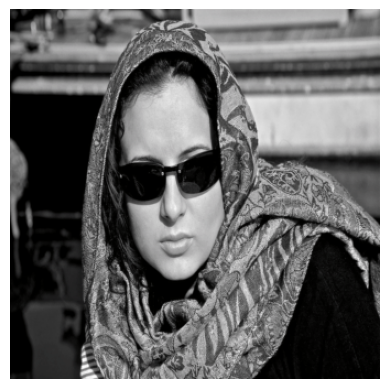

PTBTokenizer tokenized 21 tokens at 408.07 tokens per second.
PTBTokenizer tokenized 21 tokens at 410.12 tokens per second.


avg_erro: 86.36363636363636
test number = 5, WER = 115.42137908935547, BLEU = 50.11885070800781
refe: As we can see in the image there is a white color plate. In plate there is a dish. 
hypo: In this picture I can observe some food in the plate. The plate is in brown and white color. 


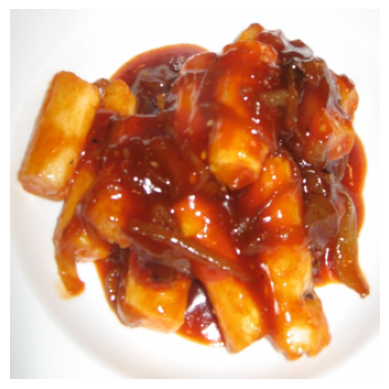

PTBTokenizer tokenized 68 tokens at 1317.47 tokens per second.
PTBTokenizer tokenized 19 tokens at 368.69 tokens per second.


avg_erro: 82.6086956521739
test number = 6, WER = 110.73384857177734, BLEU = 43.74620819091797
refe: This image is clicked in a musical concert where there is a woman Standing and she is holding a guitar in her hand. She is wearing black color dress. There is a mic in front of her and there is a bottle. She is holding a stick. There are speakers back side and there are some musical instruments on the bottom left corner. 
hypo: A person is playing a musical instrument and singing in front of him there is a mic. .


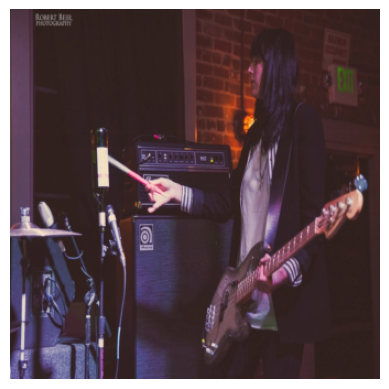

PTBTokenizer tokenized 18 tokens at 347.98 tokens per second.
PTBTokenizer tokenized 21 tokens at 327.03 tokens per second.


avg_erro: 84.21052631578947
test number = 7, WER = 107.41842651367188, BLEU = 45.46761703491211
refe: In this image, we can see a black color dog, there is a blurred background. 
hypo: In this image I can see the dog is in brown. In the background I can see the snow. 


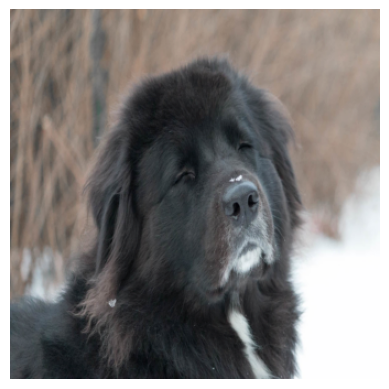

PTBTokenizer tokenized 24 tokens at 465.40 tokens per second.
PTBTokenizer tokenized 48 tokens at 936.81 tokens per second.


avg_erro: 140.0
test number = 8, WER = 111.03860473632812, BLEU = 45.58332061767578
refe: In this picture there is a bowl and a plate in the center of the image, which contains food items in it. 
hypo: In this image there is a plate and a fork placed on the table. On the right side of the image there is a spoon, knife, a bowl and a fork. On the table there are two bowls and a few food items. 


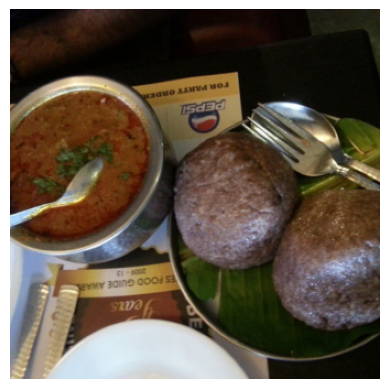

PTBTokenizer tokenized 39 tokens at 665.15 tokens per second.
PTBTokenizer tokenized 19 tokens at 348.85 tokens per second.


avg_erro: 82.5
test number = 9, WER = 108.18475341796875, BLEU = 43.041595458984375
refe: In this picture I can observe some food places in the plate. The food is in brown, orange, green and red colors. It is looking like a burger. The background is completely blurred. 
hypo: In this image, I can see a white color plate and the food item on the surface.  


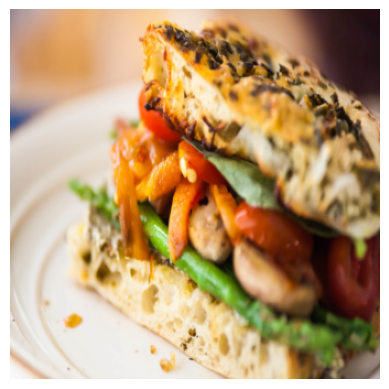

PTBTokenizer tokenized 46 tokens at 797.17 tokens per second.
PTBTokenizer tokenized 50 tokens at 952.21 tokens per second.


avg_erro: 82.97872340425532
test number = 10, WER = 105.89330291748047, BLEU = 44.67692565917969
refe: In this image i can see a person standing wearing a black shirt, blue jeans and glasses. He is holding a electronic gadget in his hand. In the background i can see few people standing, and the ceiling of the building. 
hypo: In this image we can see a person is standing. We can also see a few people standing and holding a mobile phone and also a few other objects. We can also see the screen and the screen. We can see the screen, some objects attached


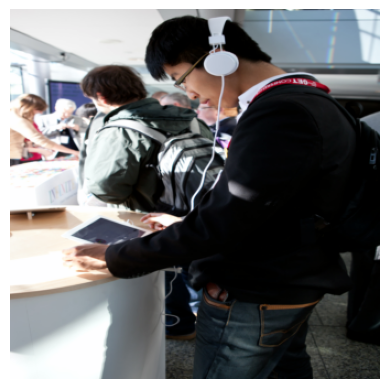

PTBTokenizer tokenized 32 tokens at 522.76 tokens per second.
PTBTokenizer tokenized 50 tokens at 1012.81 tokens per second.


avg_erro: 111.76470588235294
test number = 11, WER = 106.382568359375, BLEU = 44.70796203613281
refe: In this image we can see cars, people, banners, hoardings, tent, pole, trees, boards, and buildings. In the background there is sky. 
hypo: In this image we can see a group of people standing on the ground. We can also see a banner, a pole with some text on it, buildings with some banners and some windows. We can also see some vehicles, a pole with some text


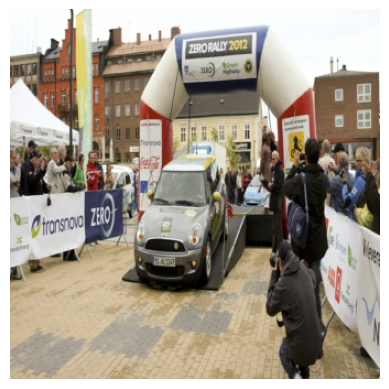

PTBTokenizer tokenized 32 tokens at 683.37 tokens per second.
PTBTokenizer tokenized 45 tokens at 874.87 tokens per second.


avg_erro: 112.12121212121211
test number = 12, WER = 106.82401275634766, BLEU = 45.21507263183594
refe: In this image we can see two persons standing and holding the objects, there are some stones, grass, plants and trees, also we can see the sky. 
hypo: In this picture there are two men and a man holding a stick and a girl holding an object. In front of them there are two persons standing and there are rocks. In the background there are trees and there is sky. 


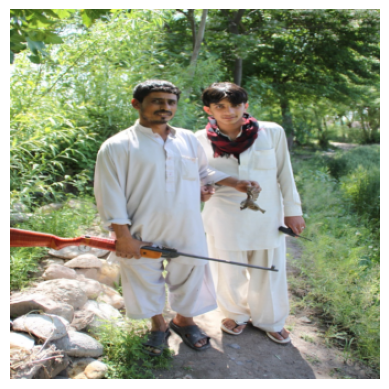

PTBTokenizer tokenized 39 tokens at 746.81 tokens per second.
PTBTokenizer tokenized 36 tokens at 611.25 tokens per second.


avg_erro: 77.27272727272727
test number = 13, WER = 104.71320343017578, BLEU = 45.107418060302734
refe: In front of the image there are some engravings on the headstone, around the headstone on the surface there are green leaves and dry leaves and sticks, behind the headstone there are trees and a wall. 
hypo: In the center of the image there is a stone. In the background of the image there is grass. There is a tree. At the bottom of the image there is grass. 


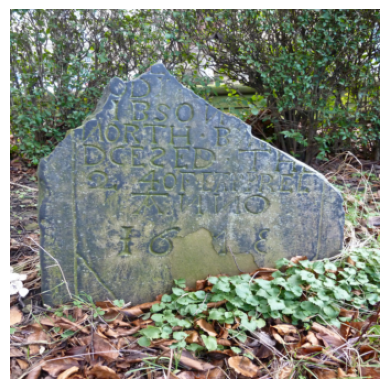

PTBTokenizer tokenized 15 tokens at 285.72 tokens per second.
PTBTokenizer tokenized 18 tokens at 332.23 tokens per second.


avg_erro: 100.0
test number = 14, WER = 104.39897918701172, BLEU = 45.3021354675293
refe: In this picture I can see building and few trees and a cloudy sky. 
hypo: In this image I see the sky. In the background I see the grass and trees.   


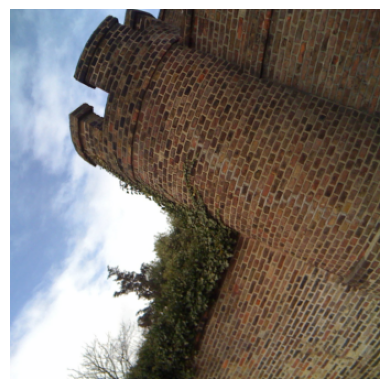

PTBTokenizer tokenized 34 tokens at 559.84 tokens per second.
PTBTokenizer tokenized 40 tokens at 748.45 tokens per second.


avg_erro: 91.42857142857143
test number = 15, WER = 103.58834838867188, BLEU = 46.05982971191406
refe: In this image there are many people in front of the building. Some of them are holding camera. In the background there are buildings. There is a banner over here. 
hypo: In this image I can see few people are standing and wearing the black color dresses and holding the camera in his hand. I can see the building in the background and the sky is in white color. 


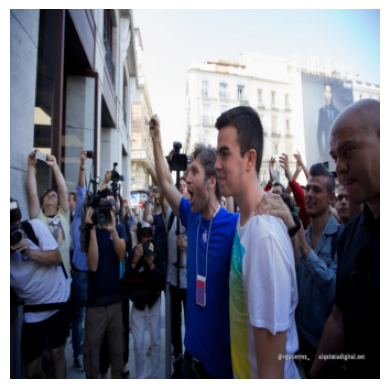

PTBTokenizer tokenized 30 tokens at 568.24 tokens per second.
PTBTokenizer tokenized 30 tokens at 531.64 tokens per second.


avg_erro: 77.41935483870968
test number = 16, WER = 102.04898834228516, BLEU = 46.320945739746094
refe: In this image I can see a snake on the ground. It is in black color. I can see few wooden sticks,few stones and grass. 
hypo: In this image there is grass on the ground. In the middle of the image there are dried leaves. On the right side there is a snake. 


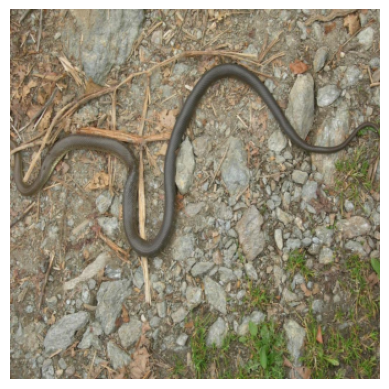

PTBTokenizer tokenized 48 tokens at 896.84 tokens per second.
PTBTokenizer tokenized 28 tokens at 464.01 tokens per second.


avg_erro: 67.3469387755102
test number = 17, WER = 100.12109375, BLEU = 46.04824447631836
refe: In this image we can see a person standing and holding a book and to the side we can see a podium with mic and there is a laptop and some other objects on the table. We can see a person standing in the bottom right. 
hypo: In this picture we can see a woman standing near the podium and speaking in the microphone, and in the background we can see the wall. 


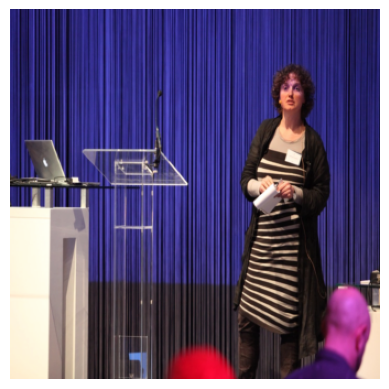

PTBTokenizer tokenized 58 tokens at 1088.74 tokens per second.
PTBTokenizer tokenized 30 tokens at 576.05 tokens per second.


avg_erro: 76.27118644067797
test number = 18, WER = 98.86583709716797, BLEU = 45.38142395019531
refe: In this picture I can see 2 women in front and the women right is holding a brush in her hand and I see the paint on the face of the woman on the left and in the background I see the grass and on the top left of this image I see the blue color things. 
hypo: In this image we can see a woman holding a camera, there is a person sitting on the ground, and in the background there are some objects. 


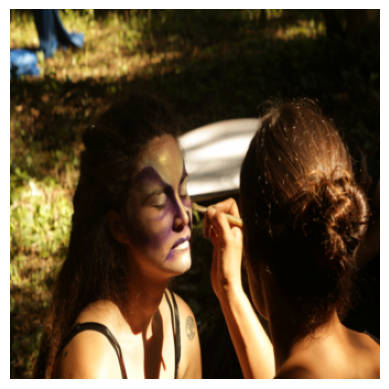

PTBTokenizer tokenized 31 tokens at 602.39 tokens per second.
PTBTokenizer tokenized 31 tokens at 583.78 tokens per second.


avg_erro: 75.75757575757575
test number = 19, WER = 97.7104263305664, BLEU = 45.87060546875
refe: In this image we can see an animal, water, rocks, and leaves. At the bottom of the image we can see a person who is truncated. 
hypo: In this image I can see a seal and a bird on it. There are two birds in the water. In the background I can see the sky. 


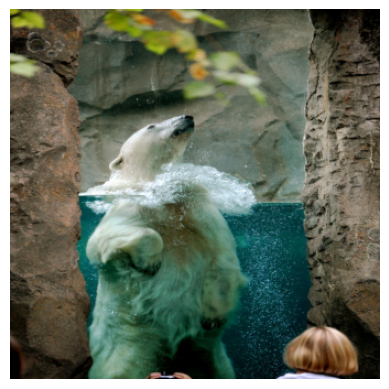

PTBTokenizer tokenized 42 tokens at 795.82 tokens per second.
PTBTokenizer tokenized 31 tokens at 592.80 tokens per second.


avg_erro: 88.37209302325581
test number = 20, WER = 97.26573944091797, BLEU = 45.9212646484375
refe: In this image we can see three people, one of them is wearing a backpack, in front of them, we can see some bags, box, also we can see some plants, grass, and trees. 
hypo: This is black and white image. In this image there are two persons wearing uniforms, shoes are standing on the ground. In the background there are trees. 


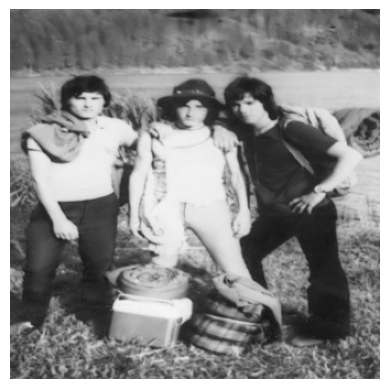

test WER: 97.26574016903524
test BLEU: 45.92126723173632
test CIDER: 1.38490044817466


In [11]:
#test_pr_coef = len( test_loader ) // 20
test_pr_coef = 1

fn = bleu_score.SmoothingFunction().method7

transforms_inv = v2.Compose([
    v2.Normalize((-0.48145466/0.26862954, -0.4578275/0.26130258, -0.40821073/0.27577711), (1/0.26862954,1/0.26130258,1/0.27577711)),
    v2.ToPILImage()
])

# 検証
with tqdm(test_loader) as pbar:
    pbar.set_description(f'[テスト]')

    # 評価モード
    model.eval()

    test_errors = deque()
    test_bleus = deque()
    test_ciders = deque()
    length_max = 50
    n_batch = 0
    for k, (imgs, captions, caption_lengths) in enumerate( pbar ):
        if k > 20:
            break
        # ミニバッチを設定
        #imgs = imgs.to(config.device)
        #captions = captions.to(config.device)
        imgs = imgs.to(device)
        captions = captions.to(device)
        #caption_lengths = torch.tensor( caption_lengths ).to(config.device)
        
        with torch.no_grad():
            outputs = inference(imgs, length_max, temperature = 0.8, top_k = 5 )
            hypo_ids = outputs

        n = 0
        hypo_sentence = []
        ref_sentence = []
        ref_imgs = []
        total_error = 0
        total_token_length = 0
        total_bleu = 0
        total_cider = 0
        n2 = 0
        for (hypo_id, caption, img ) in zip( hypo_ids, captions, imgs ):
            hypo = tokenizer.decode( [token_id for token_id in hypo_id.tolist() if token_id != 50256 ] )
            reference = tokenizer.decode( [token_id for token_id in caption.tolist() if token_id != 50256 ] )
            hypo_tokens = [tokenizer.decode( [token_id] ) for token_id in hypo_id if token_id != 50256 ]
            ref_tokens = [tokenizer.decode( [token_id] ) for token_id in caption if token_id != 50256 ]
                        
            # 認識誤りを計算
            (error, substitute, delete, insert, ref_length) = levenshtein.calculate_error(hypo_tokens, ref_tokens)
            
            # 誤り文字数を累積する
            total_error += error
            # 文字の総数を累積する
            total_token_length += ref_length

            bleu = bleu_score.sentence_bleu( [reference], hypo, smoothing_function=fn  )

            cider_ = cider(predictions=[hypo], references=[[reference]])['avg_score']
            
            #print( "cider:", cider_ )
            
            total_bleu += bleu
            total_cider += cider_
            
            if n < 1 and n_batch % test_pr_coef == 0:
                hypo_sentence.append( hypo )
                ref_sentence.append( reference )
                ref_imgs.append( img )
                   
            n += 1
            n2 += 1
                
        n_batch += 1
        avg_error = total_error / total_token_length * 100
        print( "avg_erro:", avg_error )
        avg_bleu = total_bleu / n2 * 100
        avg_cider = total_cider / n2
                
        test_errors.append(avg_error)
        test_bleus.append(avg_bleu)
        test_ciders.append( avg_cider )
        
        #if len(test_errors) > config.moving_avg:
        if len(test_errors) > 100:
            test_errors.popleft()
            test_bleus.popleft()
            test_ciders.popleft()
        mean_error = torch.Tensor(test_errors).mean().item()
        mean_bleu = torch.Tensor(test_bleus).mean().item()
        mean_cider = torch.Tensor(test_ciders).mean().item()
        pbar.set_postfix({
            #'loss': torch.Tensor(test_losses).mean().item(),
            'WER': mean_error,
            'BLEU': mean_bleu,
            'CIDER': mean_cider
        })                
                
                    
        for ( hypo_se, ref_se, img ) in zip( hypo_sentence, ref_sentence, ref_imgs ):
            print(f'test number = {k}, WER = {mean_error}, BLEU = {mean_bleu}')
            print( "refe:", ref_se )
            print( "hypo:", hypo_se )
            inv_img = transforms_inv( img )
            plt.imshow( inv_img )
            plt.axis('off')
            plt.show()


# 表示
test_error = np.mean( test_errors )
test_bleu = np.mean( test_bleus )
test_cider = np.mean( test_ciders )
print(f'test WER: {test_error}')
print(f'test BLEU: {test_bleu}')
print(f'test CIDER: {test_cider}')

In [13]:
reference="In this image we can see three people, one of them is wearing a backpack, in front of them, we can see some bags, box, also we can see some plants, grass, and trees."
hypo="In this image I can see two persons and I can also see two women are standing. I can also see that they are wearing caps and I can see a black colour bag and a white colored background. I can also see the sky. "

#reference = reference.lower()
#hypo = hypo.lower()

ref_list = reference.split( " " )
hypo_list = hypo.split( " " )

(error, substitute, delete, insert, ref_length) = levenshtein.calculate_error(hypo_list,ref_list)

print( error, substitute, delete, insert, ref_length )
print( error / ref_length * 100 )

38 26 0 12 34
111.76470588235294


In [7]:
reference="A selection of scissors, including pinking shears, under a glass shelf."
#hypo="A bunch of scissors that are on a table.OTHER.R."
hypo="A selection of scissors, including pinking shears, under a glass shelf."

#cider_ = cider(predictions=[hypo], references=[reference])['avg_score']
cider_ = cider(predictions=[hypo], references=[[reference]])
print( cider_ )

PTBTokenizer tokenized 14 tokens at 233.72 tokens per second.
PTBTokenizer tokenized 14 tokens at 241.57 tokens per second.


{'avg_score': 9.999999999999998, 'scores': array([10.])}
